<a href="https://colab.research.google.com/github/sarahdurrani/AAI-521--Group-9--EndangerDetect/blob/main/Final_Project_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import shutil
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import seaborn as sns
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model

In [ ]:
# ------------------ Step 1: Uploading Dataset ------------------
def setup_kaggle_api(kaggle_json="kaggle.json"):
    """
    Sets up the Kaggle API key for downloading datasets.
    """
    kaggle_dir = os.path.expanduser("~/.kaggle")
    os.makedirs(kaggle_dir, exist_ok=True)
    destination = os.path.join(kaggle_dir, "kaggle.json")

    if os.path.exists(kaggle_json):
        shutil.move(kaggle_json, destination)
        os.chmod(destination, 0o600)
        print("Kaggle API key set up successfully.")
    else:
        raise FileNotFoundError("ERROR: kaggle.json not found!")


def download_and_unzip_dataset(kaggle_dataset, output_dir="marine_animal_dataset"):
    """
    Downloads and unzips a dataset using Kaggle API.
    """
    print("Downloading dataset from Kaggle...")
    os.system(f"kaggle datasets download -d {kaggle_dataset}")
    print("Unzipping dataset...")
    os.system(f"unzip marine-animal-images.zip -d {output_dir}")
    print(f"Dataset unzipped successfully to {output_dir}.")



In [ ]:
# ------------------ Step 2: Exploring the Dataset ------------------

def list_directory_contents(directory):
    """
    Lists the contents of a directory.
    """
    if os.path.exists(directory):
        return os.listdir(directory)
    else:
        raise FileNotFoundError(f"ERROR: Directory '{directory}' not found!")

def display_sample_images_grid(directory, num_samples=5, grid_size=(2, 3)):
    """
    Displays sample images from each class in the directory in a grid format.

    Args:
        directory (str): Path to the directory containing class folders.
        num_samples (int): Number of images to display per class.
        grid_size (tuple): Number of rows and columns in the grid.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']
    classes = list_directory_contents(directory)

    for class_name in classes:
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            print(f"Displaying images from class: {class_name}")
            images = [img for img in os.listdir(class_path) if img.lower().endswith(tuple(image_extensions))]

            # Adjust the number of samples based on available images
            num_images = min(num_samples, len(images))
            fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(12, 8))
            fig.suptitle(f"Class: {class_name}", fontsize=16)

            # Display images in the grid
            for idx, ax in enumerate(axes.flatten()):
                if idx < num_images:
                    img_path = os.path.join(class_path, images[idx])
                    image = cv2.imread(img_path)
                    if image is not None:
                        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                        ax.axis("off")
                        ax.set_title(f"Image {idx + 1}")
                else:
                    ax.axis("off")  # Turn off extra axes

            plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit title
            plt.show()


In [ ]:
# ------------------ Step 3: Preprocessing and EDA ------------------

def preprocess_image(image_path, size=(224, 224)):
    """
    Preprocesses a single image: resize and normalize.
    """
    img = Image.open(image_path).convert('RGB')
    img = img.resize(size)
    return np.array(img) / 255.0


def count_images_per_class(directory):
    """
    Counts the number of images in each class directory.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']
    classes = list_directory_contents(directory)
    class_counts = {}
    for class_name in classes:
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            image_files = [
                img for img in os.listdir(class_path) if img.lower().endswith(tuple(image_extensions))
            ]
            class_counts[class_name] = len(image_files)
    return class_counts


In [ ]:
# ------------------ Step 4: Model Training ------------------

def build_model(input_shape=(224, 224, 3), num_classes=9):
    """
    Builds and compiles a ResNet50 model for training.
    """
    base_model = ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)
    x = Flatten()(base_model.output)
    x = Dense(128, activation="relu")(x)
    predictions = Dense(num_classes, activation="softmax")(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
    return model



In [ ]:
# ------------------ Step 5: Integration with WWF Data ------------------

def integrate_wwf_data(predictions, wwf_csv):
    """
    Integrates predictions with WWF conservation data.
    """
    # Load WWF data
    wwf_data = pd.read_csv(wwf_csv)

    # Inspect the dataset
    print("Columns in the WWF dataset:", wwf_data.columns)
    if 'COMMON NAME' in wwf_data.columns:
        wwf_data['COMMON NAME'] = wwf_data['COMMON NAME'].str.lower().str.strip()
    else:
        raise KeyError("The WWF dataset does not contain a 'COMMON NAME' column.")

    # Remove duplicates
    wwf_data = wwf_data.drop_duplicates(subset='COMMON NAME')

    # Map predictions to conservation status
    results = pd.DataFrame({
        'Predicted Species': predictions,
        'Conservation Status': [
            wwf_data[wwf_data['COMMON NAME'] == sp.lower().strip()]['CONSERVATION STATUS'].values[0]
            if len(wwf_data[wwf_data['COMMON NAME'] == sp.lower().strip()]) > 0 else 'Unknown'
            for sp in predictions
        ]
    })
    print(results)



Kaggle API key set up successfully.
Unzipping dataset...
Dataset unzipped successfully to marine_animal_dataset.
Displaying images from class: Harbor seal


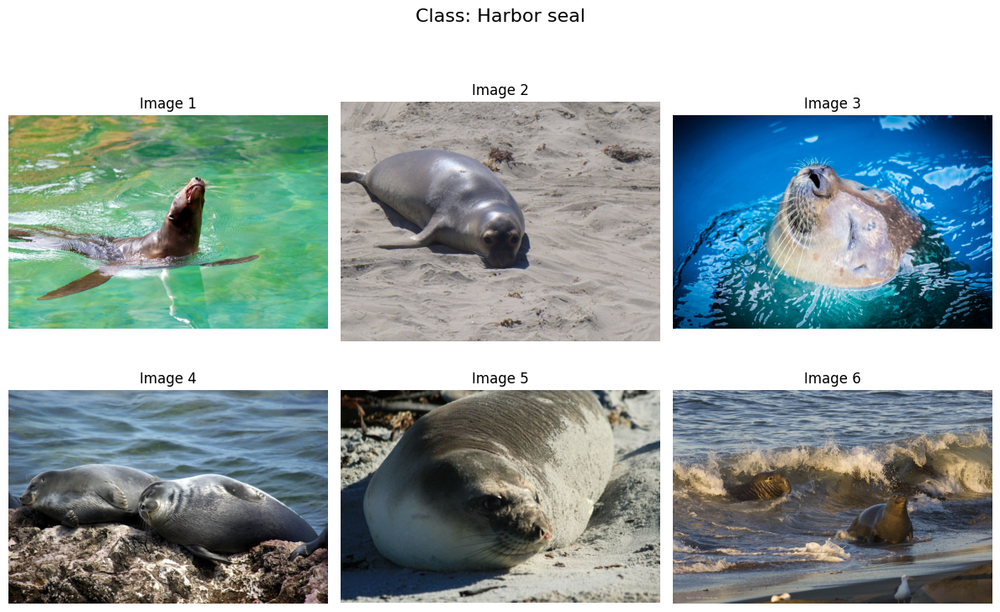

Displaying images from class: Lobster


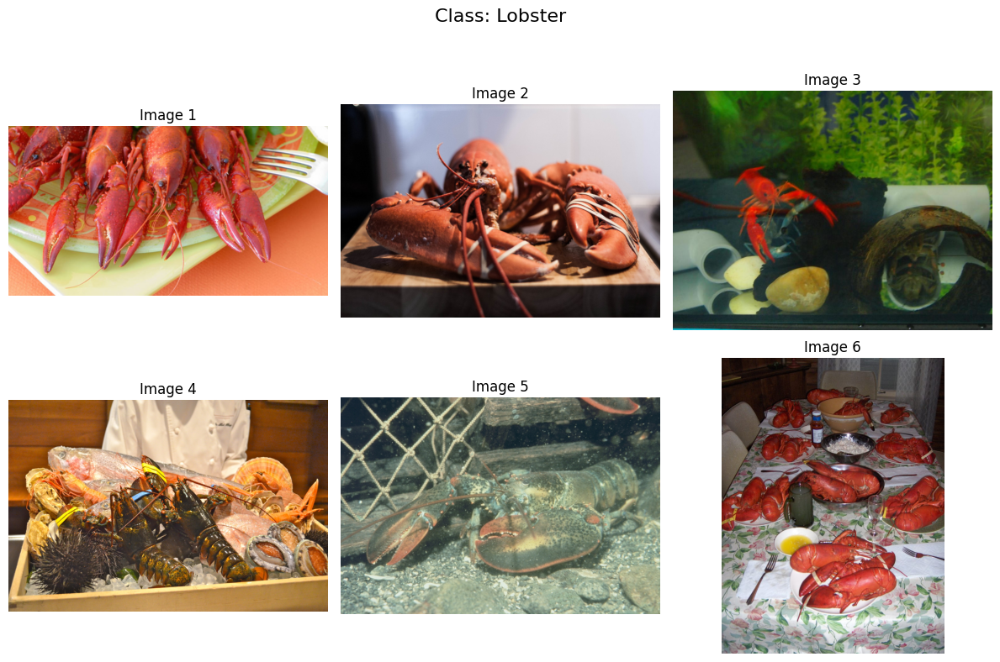

Displaying images from class: Starfish


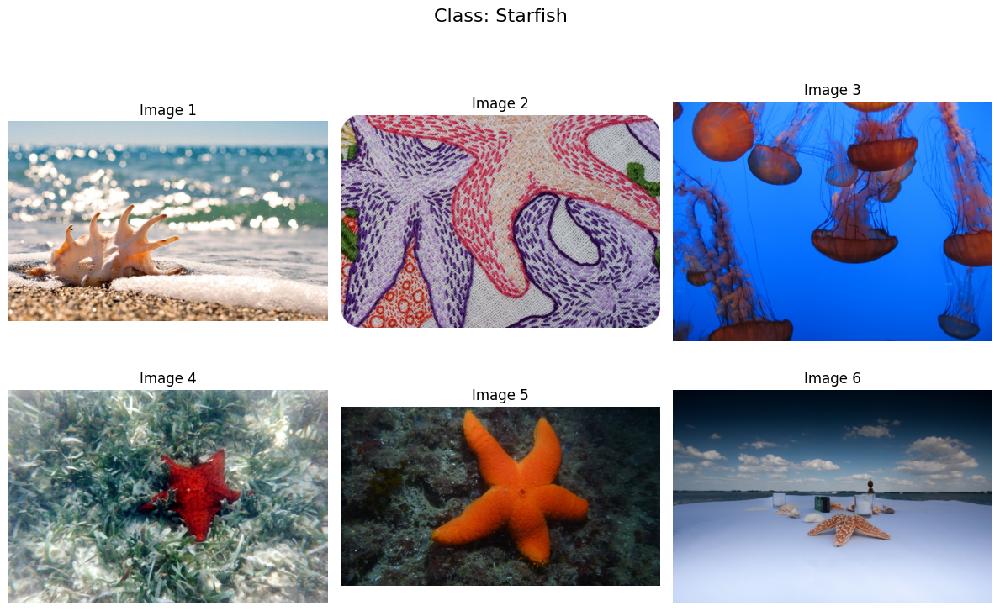

Displaying images from class: Fish


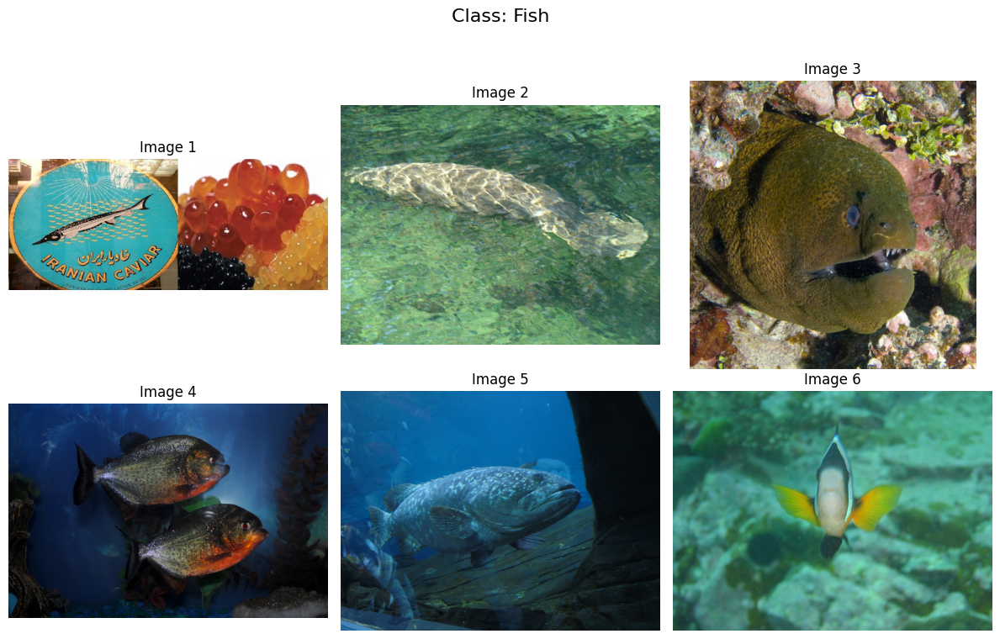

Displaying images from class: Jellyfish


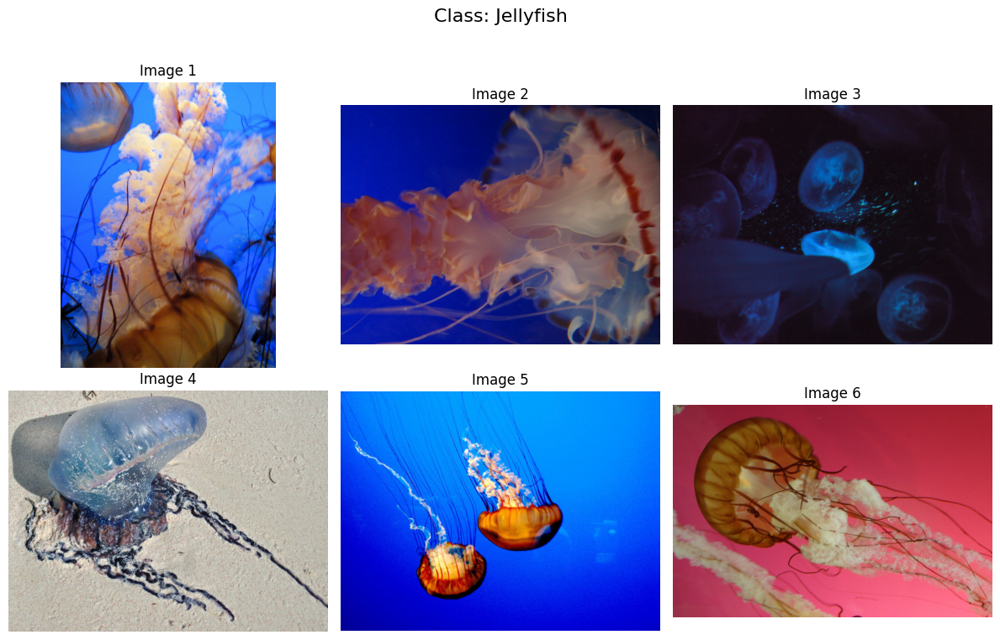

Displaying images from class: Squid


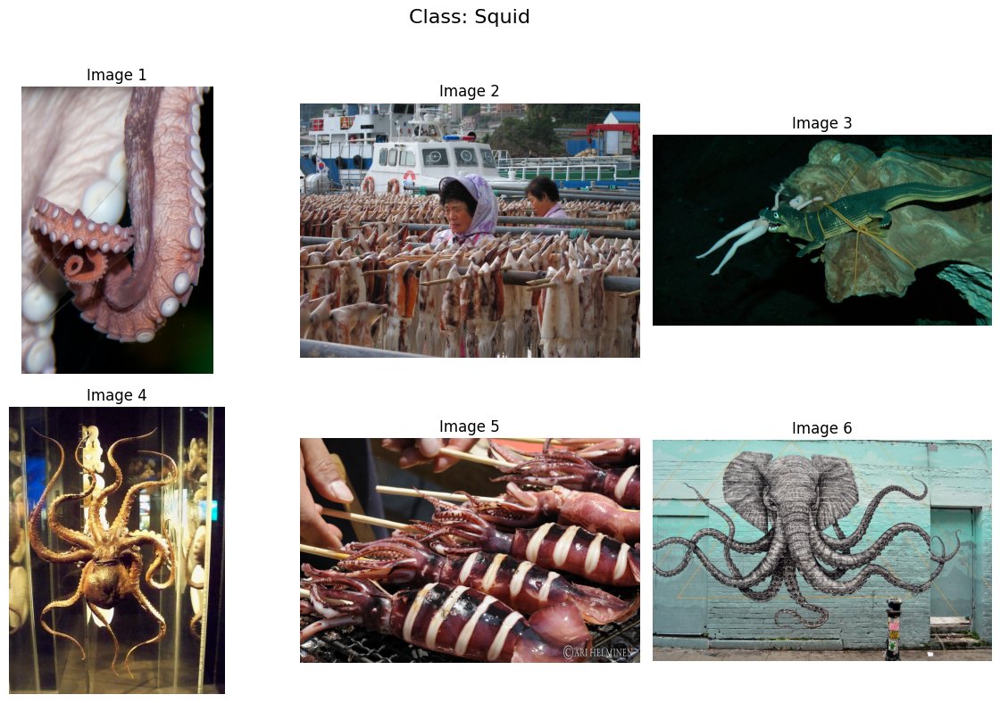

Displaying images from class: Goldfish


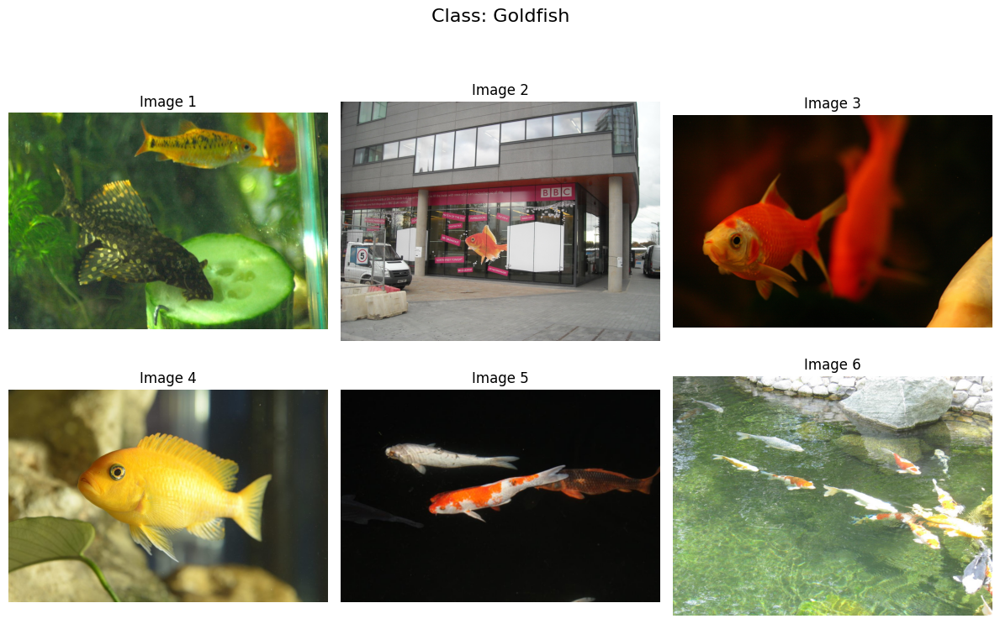

Displaying images from class: Oyster


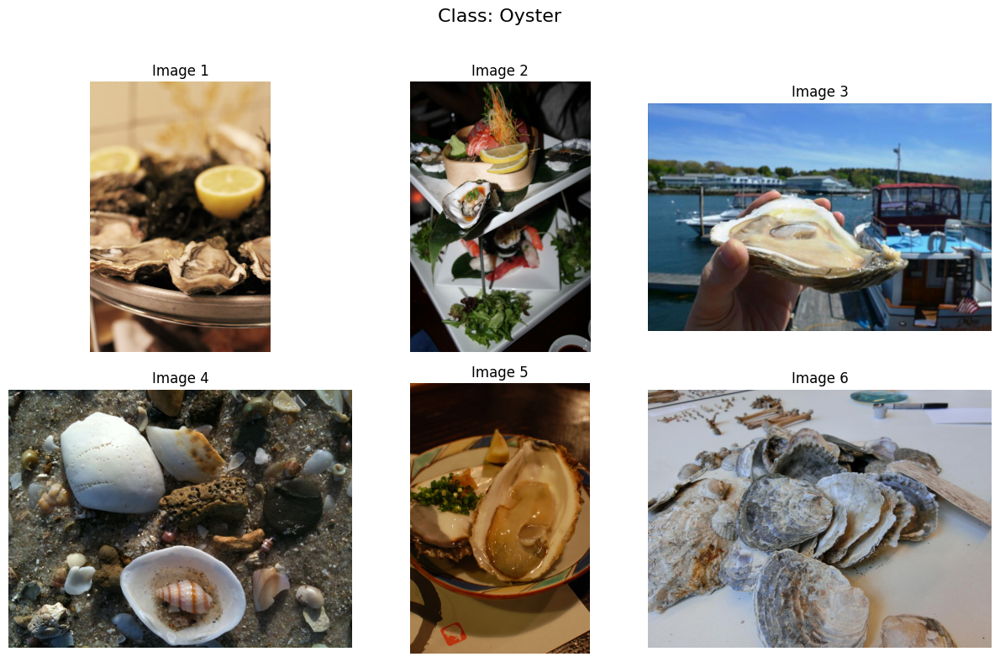

Displaying images from class: Sea turtle


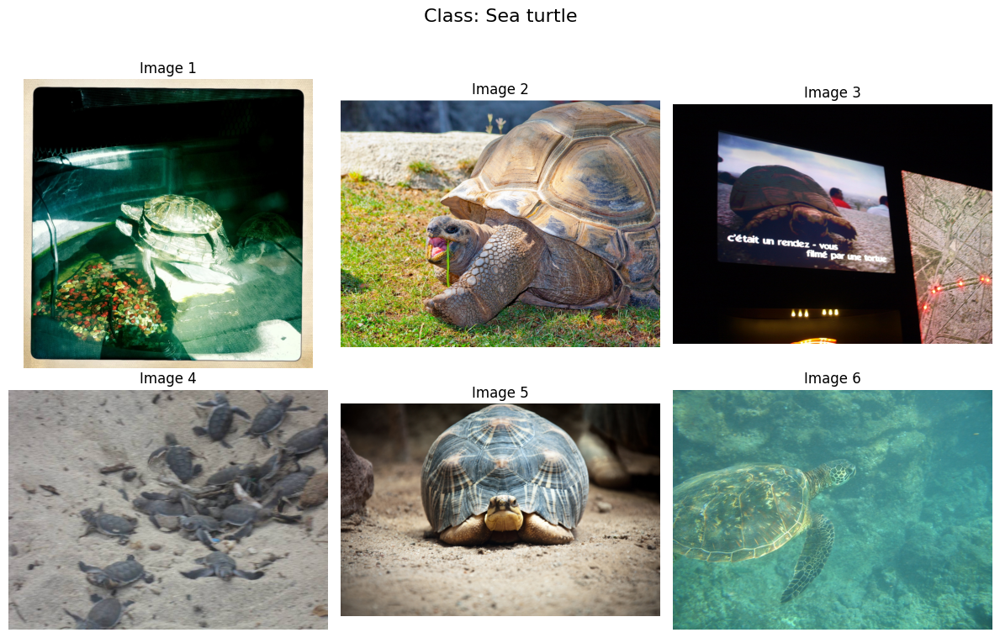

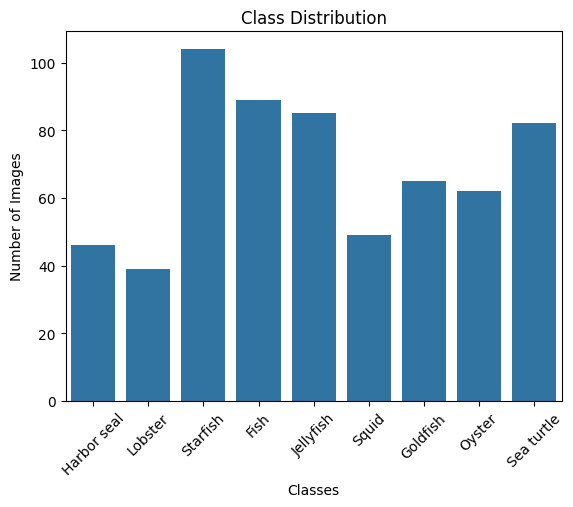

Columns in the WWF dataset: Index(['COMMON NAME', 'SCIENTIFIC NAME', 'CONSERVATION STATUS'], dtype='object')
    Predicted Species Conservation Status
0  leatherback turtle          Vulnerable
1          blue whale          Endangered
2   great white shark          Vulnerable


In [ ]:
# ------------------ Main Workflow ------------------
if __name__ == "__main__":
    # Step 1: Setup and download dataset
    kaggle_dataset = "mikoajfish99/marine-animal-images"
    setup_kaggle_api()
    download_and_unzip_dataset(kaggle_dataset)

    # Step 2: Explore dataset
    images_dir = os.path.join("marine_animal_dataset", "images", "train")
    display_sample_images_grid(images_dir, num_samples=6, grid_size=(2, 3))

    # Step 3: Perform EDA
    class_counts = count_images_per_class(images_dir)
    sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
    plt.title("Class Distribution")
    plt.xlabel("Classes")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)
    plt.show()

    # Step 4: Train the model
    model = build_model()
    # Additional steps for training...

    # Step 5: Integrate WWF data
    predictions = ["leatherback turtle", "blue whale", "great white shark"]
    integrate_wwf_data(predictions, "WWF list of endangered marine animals  - Sheet1.csv")


In [22]:
!pip install pyngrok
!pip install streamlit
!pip install streamlit pyngrok


In [ ]:
from pyngrok import ngrok
import pandas as pd
import streamlit as st

# Load WWF data
@st.cache_data
def load_wwf_data(wwf_csv):
  """
    Loads and preprocesses the WWF dataset.
    """
  wwf_data = pd.read_csv(wwf_csv)
  wwf_data['COMMON NAME'] = wwf_data['COMMON NAME'].str.lower().str.strip()
  wwf_data = wwf_data.drop_duplicates(subset='COMMON NAME')
  return wwf_data

# Check if the species is endangered
def get_conservation_status(species, wwf_data):
    """
    Returns the conservation status of the species from the WWF dataset.
    """
    status = wwf_data[wwf_data['COMMON NAME'] == species.lower().strip()]['CONSERVATION STATUS'].values
    return status[0] if len(status) > 0 else "Unknown"

# Streamlit UI
def main():
    # Title
    st.title("Endangered Marine Animal Classifier")
    st.write("Upload an image of a marine animal to check its conservation status.")

    # Load WWF dataset
    wwf_csv = "WWF list of endangered marine animals  - Sheet1.csv"
    wwf_data = load_wwf_data(wwf_csv)

    # Upload image
    uploaded_file = st.file_uploader("Upload an image", type=["jpg", "jpeg", "png"])
    if uploaded_file is not None:
        # Display uploaded image
        st.image(uploaded_file, caption="Uploaded Image", use_column_width=True)

        # Mock prediction (replace with your model's prediction)
        mock_predictions = {
            "leatherback turtle": "Endangered",
            "blue whale": "Endangered",
            "great white shark": "Vulnerable",
        }
        species = st.text_input("Enter the predicted species name:")
        if st.button("Check Conservation Status"):
            if species:
                # Get status from WWF data
                status = get_conservation_status(species, wwf_data)
                st.write(f"The species '{species}' is classified as: {status}")
            else:
                st.warning("Please enter a species name.")

# Run the app
if __name__ == "__main__":
    main()

2024-12-09 03:41:57.235 No runtime found, using MemoryCacheStorageManager
2024-12-09 03:41:57.240 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-09 03:41:57.242 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-09 03:41:57.244 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-09 03:41:57.247 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-09 03:41:57.249 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-09 03:41:57.253 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-09 03:41:57.255 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-09 03:41:57.256 Thread 'MainThread':